In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
import sklearn
from sklearn.metrics import mean_squared_error, r2_score
import os
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import random
from src.utils.config import config
import warnings
np.random.seed(34)
warnings.filterwarnings('ignore')



From competition: https://www.kaggle.com/datasets/behrad3d/nasa-cmaps?select=CMaps

## TLDR
- The train set: full “run-to-failure” time series. Can derive RUL for every time step (for supervision) by doing `RUL = (max_cycle_for_that_unit) – current_cycle`.
- The test set: partial time series (no failure observed in the data). Only have RUL labels for the last cycle in each test series (i.e. how many cycles remain after that last observed point).

Test set like as a validation set (train on train, predict on test, evaluate using the provided RULs) -> RMSE.

## Prediction Goal

In this dataset the goal is to predict the remaining useful life (RUL) of each engine in the test dataset. RUL is equivalent of number of flights remained for the engine after the last datapoint in the test dataset.

Data sets consists of multiple multivariate time series. Each data set is further divided into training and test subsets. Each time series is from a different engine i.e., the data can be considered to be from a fleet of engines of the same type. Each engine starts with different degrees of initial wear and manufacturing variation which is unknown to the user. This wear and variation is considered normal, i.e., it is not considered a fault condition. There are three operational settings that have a substantial effect on engine performance. These settings are also included in the data. The data is contaminated with sensor noise.

The engine is operating normally at the start of each time series, and develops a fault at some point during the series. In the training set, the fault grows in magnitude until system failure. In the test set, the time series ends some time prior to system failure. The objective of the competition is to predict the number of remaining operational cycles before failure in the test set, i.e., the number of operational cycles after the last cycle that the engine will continue to operate. Also provided a vector of true Remaining Useful Life (RUL) values for the test data.

In [2]:
index_names = ['unit_number', 'time_cycles']
setting_names = ['setting_1', 'setting_2', 'setting_3']
sensor_names = ['s_{}'.format(i+1) for i in range(0,21)]
col_names = index_names + setting_names + sensor_names

# Load

In [90]:
raw_data_path = config.RAW_DATA_PATH / 'CMaps/'

datasets = {}

for fd_num in ['001', '002', '003', '004']:
    datasets[fd_num] = {
        'train': pd.read_csv(raw_data_path / f'train_FD{fd_num}.txt', sep='\s+', header=None, index_col=False, names=col_names),
        'valid': pd.read_csv(raw_data_path / f'test_FD{fd_num}.txt', sep='\s+', header=None, index_col=False, names=col_names),
        'rul': pd.read_csv(raw_data_path / f'RUL_FD{fd_num}.txt', sep='\s+', header=None, index_col=False, names=['RUL'])
    }

FD001 test shape: (13096, 26)
FD002 test shape: (33991, 26)
FD003 test shape: (16596, 26)
FD004 test shape: (41214, 26)


In [91]:
datasets['001']['train'].describe()

,unit_number,time_cycles,setting_1,setting_2,setting_3,s_1,s_2,s_3,s_4,s_5,...,s_12,s_13,s_14,s_15,s_16,s_17,s_18,s_19,s_20,s_21
count,20631.000000,20631.000000,20631.000000,20631.000000,20631.0,20631.00,20631.000000,20631.000000,20631.000000,2.063100e+04,...,20631.000000,20631.000000,20631.000000,20631.000000,2.063100e+04,20631.000000,20631.0,20631.0,20631.000000,20631.000000
mean,51.506568,108.807862,-0.000009,0.000002,100.0,518.67,642.680934,1590.523119,1408.933782,1.462000e+01,...,521.413470,2388.096152,8143.752722,8.442146,3.000000e-02,393.210654,2388.0,100.0,38.816271,23.289705
std,29.227633,68.880990,0.002187,0.000293,0.0,0.00,0.500053,6.131150,9.000605,5.329200e-15,...,0.737553,0.071919,19.076176,0.037505,3.469531e-18,1.548763,0.0,0.0,0.180746,0.108251
min,1.000000,1.000000,-0.008700,-0.000600,100.0,518.67,641.210000,1571.040000,1382.250000,1.462000e+01,...,518.690000,2387.880000,8099.940000,8.324900,3.000000e-02,388.000000,2388.0,100.0,38.140000,22.894200
25%,26.000000,52.000000,-0.001500,-0.000200,100.0,518.67,642.325000,1586.260000,1402.360000,1.462000e+01,...,520.960000,2388.040000,8133.245000,8.414900,3.000000e-02,392.000000,2388.0,100.0,38.700000,23.221800
50%,52.000000,104.000000,0.000000,0.000000,100.0,518.67,642.640000,1590.100000,1408.040000,1.462000e+01,...,521.480000,2388.090000,8140.540000,8.438900,3.000000e-02,393.000000,2388.0,100.0,38.830000,23.297900
75%,77.000000,156.000000,0.001500,0.000300,100.0,518.67,643.000000,1594.380000,1414.555000,1.462000e+01,...,521.950000,2388.140000,8148.310000,8.465600,3.000000e-02,394.000000,2388.0,100.0,38.950000,23.366800
max,100.000000,362.000000,0.008700,0.000600,100.0,518.67,644.530000,1616.910000,1441.490000,1.462000e+01,...,523.380000,2388.560000,8293.720000,8.584800,3.000000e-02,400.000000,2388.0,100.0,39.430000,23.618400


The dataset FD001 contains time series of 21 sensors and 3 settings of 100 units(turbofan engine).Each engine works normally at the beginning of each time series and fails at the end of the time series. Each row is a snapshot of the data taken during a single operation cycle.

In [92]:
for fd_num in ['001', '002', '003', '004']:
    train = datasets[fd_num]['train']
    valid = datasets[fd_num]['valid']
    print(f'FD{fd_num}:')
    print(f'  Train shape: {train.shape}')
    print(f'  Valid shape: {valid.shape}')
    print(f'  Valid %: {len(valid)/(len(valid)+len(train))*100.0:.3f}')
    print()

FD001:
  Train shape: (20631, 26)
  Valid shape: (13096, 26)
  Valid %: 38.829

FD002:
  Train shape: (53759, 26)
  Valid shape: (33991, 26)
  Valid %: 38.736

FD003:
  Train shape: (24720, 26)
  Valid shape: (16596, 26)
  Valid %: 40.168

FD004:
  Train shape: (61249, 26)
  Valid shape: (41214, 26)
  Valid %: 40.223



In [93]:
#Cheking the presence of Nan values
for fd_num in ['001', '002', '003', '004']:
    train = datasets[fd_num]['train']
    valid = datasets[fd_num]['valid']
    print(f'FD{fd_num} - Train None values: {train.isna().sum().sum()}, Valid None values: {valid.isna().sum().sum()}')

FD001 - Train None values: 0, Valid None values: 0
FD002 - Train None values: 0, Valid None values: 0
FD003 - Train None values: 0, Valid None values: 0
FD004 - Train None values: 0, Valid None values: 0


# Basic walkthrough

- How many engine units total?
- Average cycles per engine?
- Which sensors show meaningful variation?
- Are there missing values?
- What's the RUL distribution?

### Number of engine units per dataset

In [96]:
for fd_num in ['001', '002', '003', '004']:
    train = datasets[fd_num]['train']['unit_number'].nunique()
    valid = datasets[fd_num]['valid']['unit_number'].nunique()
    print(f'FD{fd_num} - Train unit count: {train}, Valid unit count: {valid}')

FD001 - Train unit count: 100, Valid unit count: 100
FD002 - Train unit count: 260, Valid unit count: 259
FD003 - Train unit count: 100, Valid unit count: 100
FD004 - Train unit count: 249, Valid unit count: 248


### Max time cycle found for each Unit

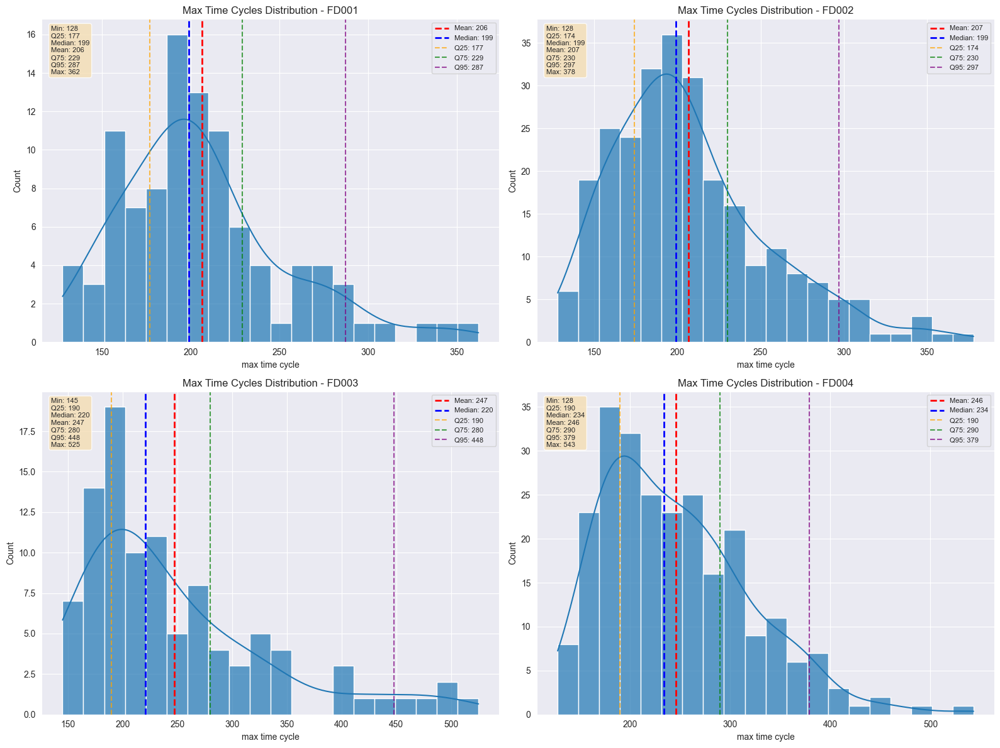

In [95]:
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.ravel()

for i, fd_num in enumerate(['001', '002', '003', '004']):
    train = datasets[fd_num]['train']

    # Create the distribution plot
    max_time_cycles = train[index_names].groupby('unit_number').max()

    plt.subplot(2, 2, i+1)
    sns.histplot(max_time_cycles['time_cycles'], kde=True, bins=20, alpha=0.7)
    plt.xlabel('max time cycle')
    plt.title(f'Max Time Cycles Distribution - FD{fd_num}')

    data = max_time_cycles['time_cycles']
    mean_val = data.mean()
    median_val = data.median()
    max_val = data.max()
    min_val = data.min()
    q25 = data.quantile(0.25)
    q75 = data.quantile(0.75)
    q95 = data.quantile(0.95)

    plt.axvline(mean_val, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_val:.0f}')
    plt.axvline(median_val, color='blue', linestyle='--', linewidth=2, label=f'Median: {median_val:.0f}')
    plt.axvline(q25, color='orange', linestyle='--', alpha=0.7, label=f'Q25: {q25:.0f}')
    plt.axvline(q75, color='green', linestyle='--', alpha=0.7, label=f'Q75: {q75:.0f}')
    plt.axvline(q95, color='purple', linestyle='--', alpha=0.7, label=f'Q95: {q95:.0f}')

    stats_text = f'Min: {min_val:.0f}\nQ25: {q25:.0f}\nMedian: {median_val:.0f}\nMean: {mean_val:.0f}\nQ75: {q75:.0f}\nQ95: {q95:.0f}\nMax: {max_val:.0f}'
    plt.text(0.02, 0.98, stats_text, transform=plt.gca().transAxes,
             verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8), fontsize=8)

    plt.legend(fontsize=8)

plt.tight_layout()
plt.show()

# Add RUL column to the data (calculate on Train)

In [97]:
def add_RUL_column(df):
    train_grouped_by_unit = df.groupby(by='unit_number')
    max_time_cycles = train_grouped_by_unit['time_cycles'].max()
    merged = df.merge(max_time_cycles.to_frame(name='max_time_cycle'), left_on='unit_number',right_index=True)
    merged["RUL"] = merged["max_time_cycle"] - merged['time_cycles']
    merged = merged.drop("max_time_cycle", axis=1)
    return merged

# Apply to all datasets
for fd_num in ['001', '002', '003', '004']:
    datasets[fd_num]['train'] = add_RUL_column(datasets[fd_num]['train'])

In [75]:
#Rul analysis
maxrul_u = train.groupby('unit_number').max().reset_index()
maxrul_u.head()

,unit_number,time_cycles,setting_1,setting_2,setting_3,s_1,s_2,s_3,s_4,s_5,...,s_13,s_14,s_15,s_16,s_17,s_18,s_19,s_20,s_21,RUL
0,1,321,42.0079,0.8420,100.0,518.67,643.50,1603.28,1422.53,14.62,...,2388.87,8184.95,10.9141,0.03,397,2388,100.0,39.58,23.8649,320
1,2,299,42.0079,0.8420,100.0,518.67,643.88,1599.51,1434.23,14.62,...,2388.37,8143.04,11.0337,0.03,396,2388,100.0,39.15,23.4692,298
2,3,307,42.0079,0.8420,100.0,518.67,643.45,1605.04,1425.73,14.62,...,2388.91,8188.39,10.8552,0.03,396,2388,100.0,39.51,23.7657,306
3,4,274,42.0080,0.8419,100.0,518.67,644.07,1605.47,1432.75,14.62,...,2389.42,8210.13,11.0113,0.03,397,2388,100.0,39.11,23.4354,273
4,5,193,42.0072,0.8418,100.0,518.67,643.76,1607.29,1430.47,14.62,...,2389.46,8187.83,11.0254,0.03,398,2388,100.0,38.96,23.4060,192


## Discovering Correlations

Linear relationship

Data non-normal, but can help understand some correlations

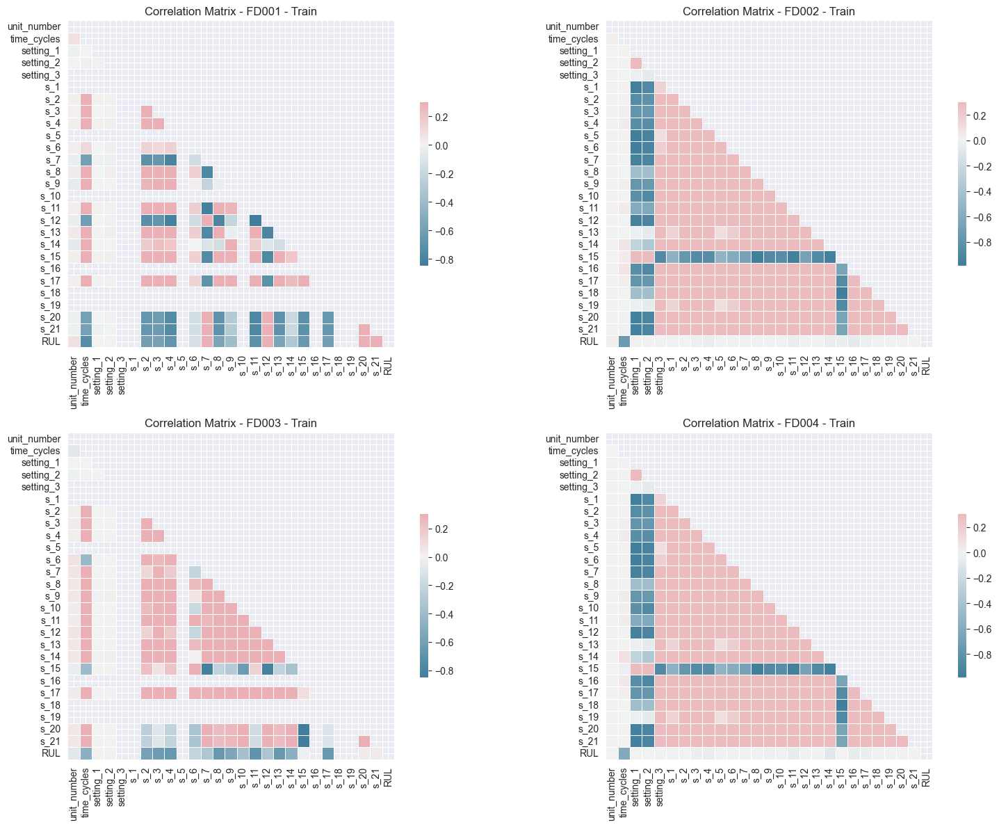

In [104]:
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.ravel()

for i, fd_num in enumerate(['001', '002', '003', '004']):
    train = datasets[fd_num]['train']

    corr = train.corr(method='spearman')
    mask = np.triu(np.ones_like(corr, dtype=bool))

    plt.subplot(2, 2, i+1)
    cmap = sns.diverging_palette(230, 10, as_cmap=True)

    sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
                square=True, linewidths=.5, cbar_kws={"shrink": .5})
    plt.title(f'Correlation Matrix - FD{fd_num} - Train')

plt.tight_layout()
plt.show()

Questions to answer :
- Can we efficiently predict the remaining useful time for the engine (error significance) ?
- Which features are the most important for predicting the failure of the turbofan engine ?
- Does adding historical data improve our model ?
- Is the collected data sufficient enough to give an accurate prediction ?
- How can we turn our problem to a classification one ?

# Plotting the evolution of sensors vs the evolution with RUL

From nasa web site, won't help prediction, just for human comprehension:

In [77]:
Sensor_dictionary={}
dict_list=[ "(Fan inlet temperature) (◦R)",
"(LPC outlet temperature) (◦R)",
"(HPC outlet temperature) (◦R)",
"(LPT outlet temperature) (◦R)",
"(Fan inlet Pressure) (psia)",
"(bypass-duct pressure) (psia)",
"(HPC outlet pressure) (psia)",
"(Physical fan speed) (rpm)",
"(Physical core speed) (rpm)",
"(Engine pressure ratio(P50/P2)",
"(HPC outlet Static pressure) (psia)",
"(Ratio of fuel flow to Ps30) (pps/psia)",
"(Corrected fan speed) (rpm)",
"(Corrected core speed) (rpm)",
"(Bypass Ratio) ",
"(Burner fuel-air ratio)",
"(Bleed Enthalpy)",
"(Required fan speed)",
"(Required fan conversion speed)",
"(High-pressure turbines Cool air flow)",
"(Low-pressure turbines Cool air flow)" ]
i=1
for x in dict_list :
    Sensor_dictionary['s_'+str(i)]=x
    i+=1
Sensor_dictionary

{'s_1': '(Fan inlet temperature) (◦R)',
 's_2': '(LPC outlet temperature) (◦R)',
 's_3': '(HPC outlet temperature) (◦R)',
 's_4': '(LPT outlet temperature) (◦R)',
 's_5': '(Fan inlet Pressure) (psia)',
 's_6': '(bypass-duct pressure) (psia)',
 's_7': '(HPC outlet pressure) (psia)',
 's_8': '(Physical fan speed) (rpm)',
 's_9': '(Physical core speed) (rpm)',
 's_10': '(Engine pressure ratio(P50/P2)',
 's_11': '(HPC outlet Static pressure) (psia)',
 's_12': '(Ratio of fuel flow to Ps30) (pps/psia)',
 's_13': '(Corrected fan speed) (rpm)',
 's_14': '(Corrected core speed) (rpm)',
 's_15': '(Bypass Ratio) ',
 's_16': '(Burner fuel-air ratio)',
 's_17': '(Bleed Enthalpy)',
 's_18': '(Required fan speed)',
 's_19': '(Required fan conversion speed)',
 's_20': '(High-pressure turbines Cool air flow)',
 's_21': '(Low-pressure turbines Cool air flow)'}

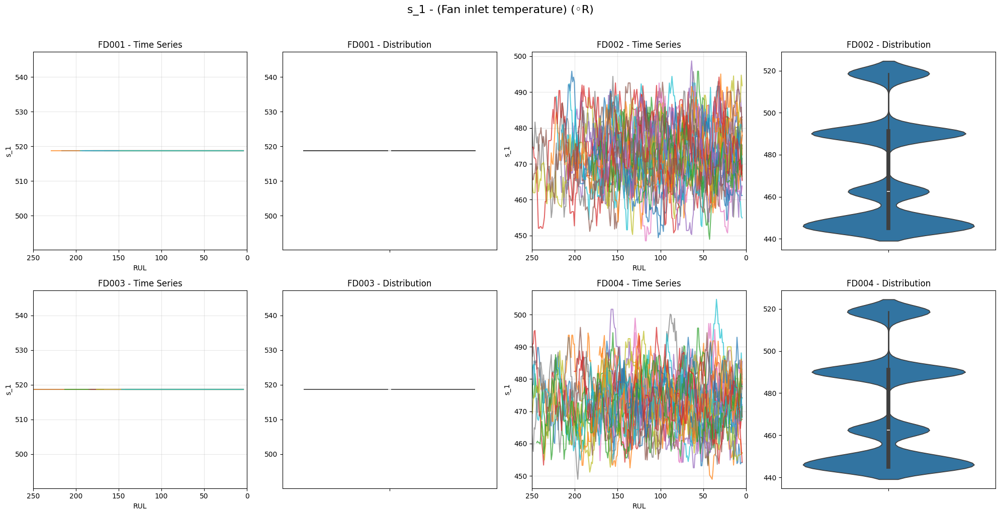

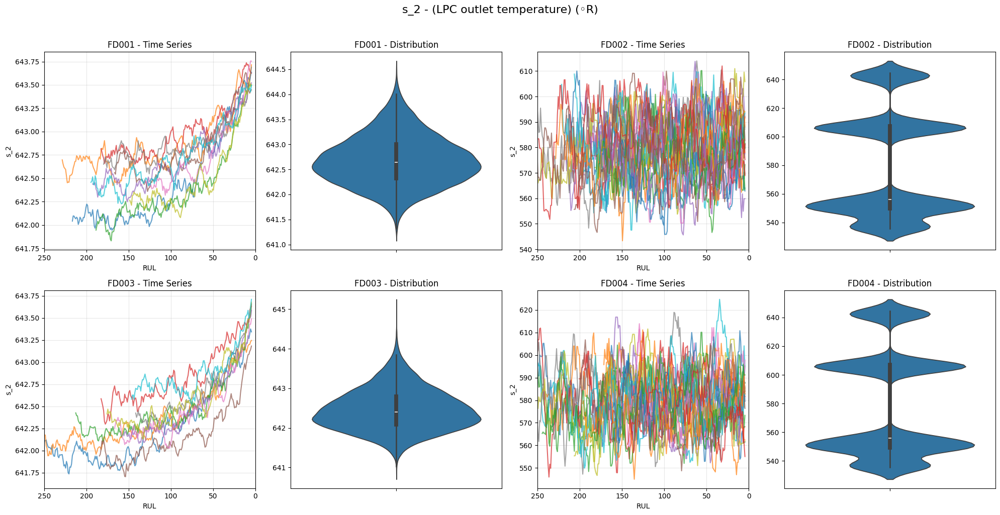

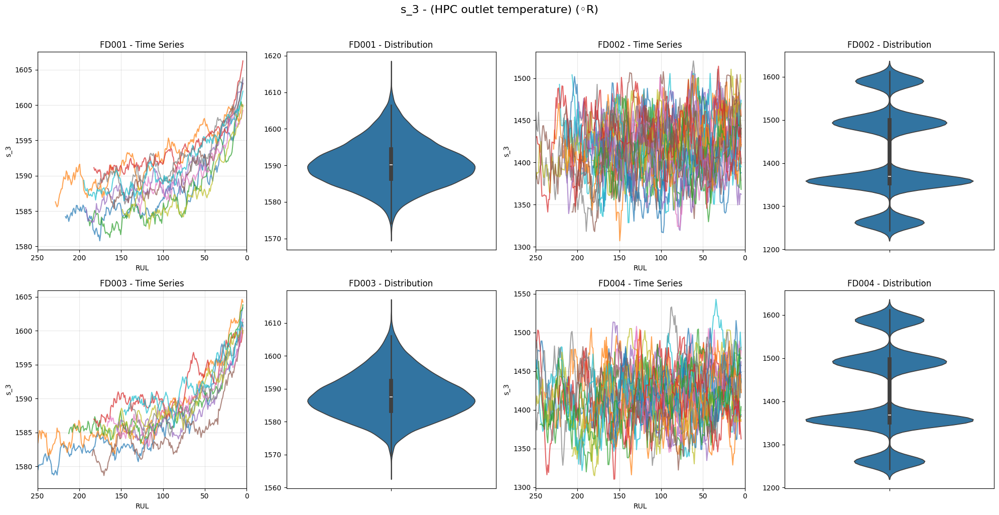

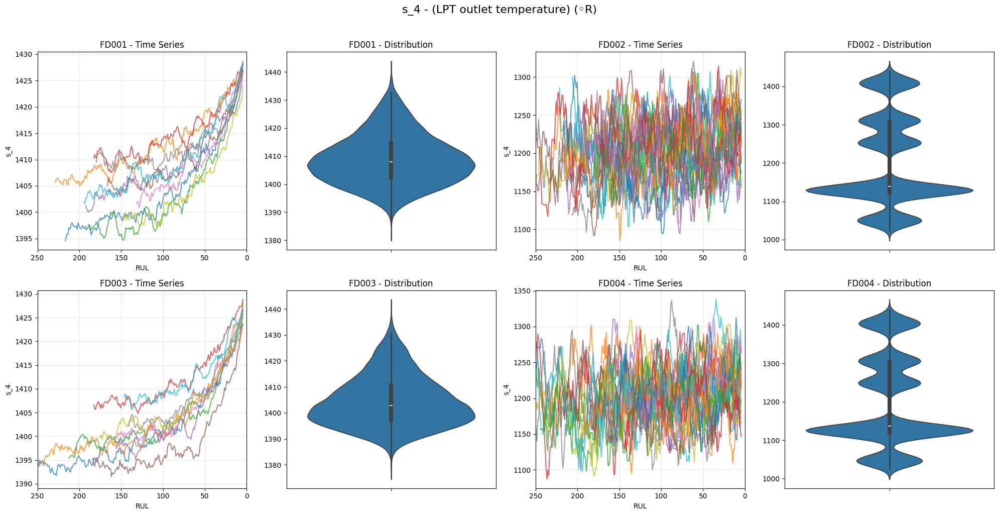

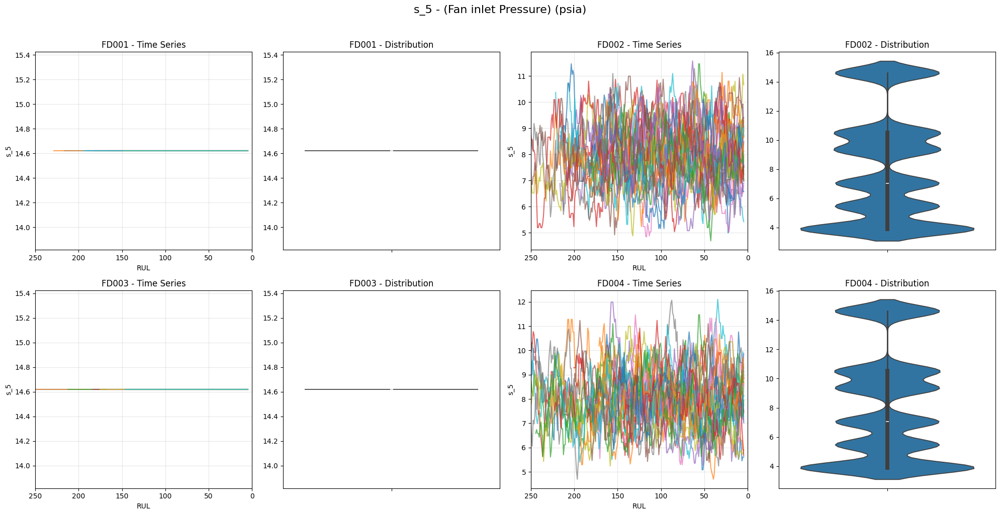

...

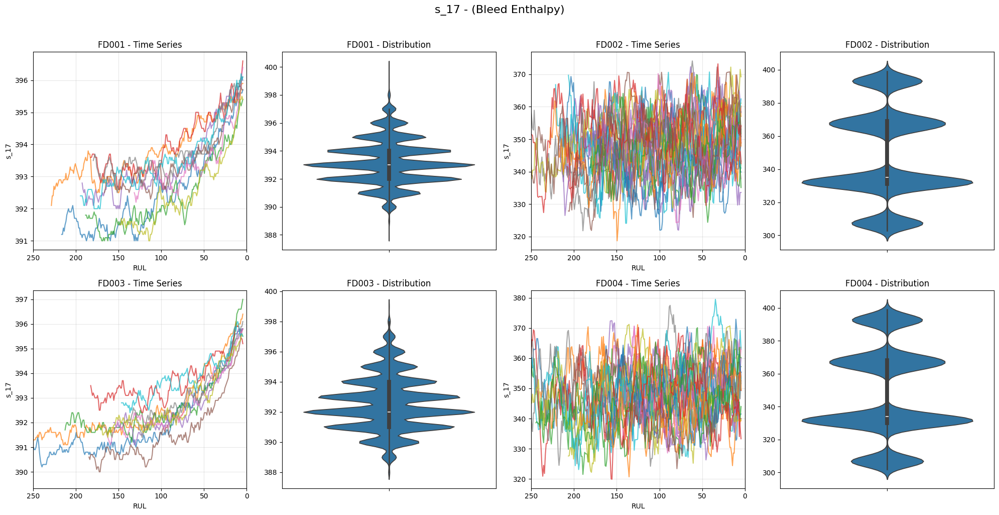

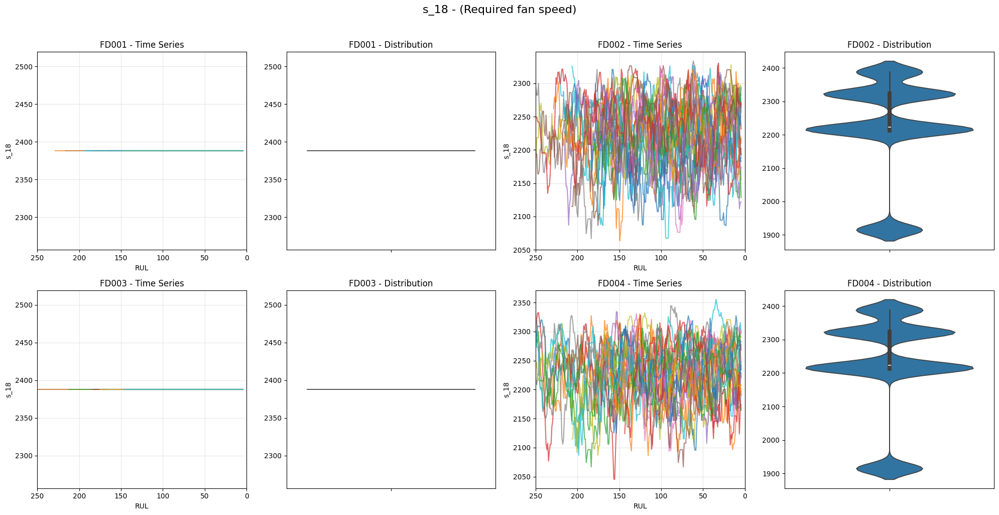

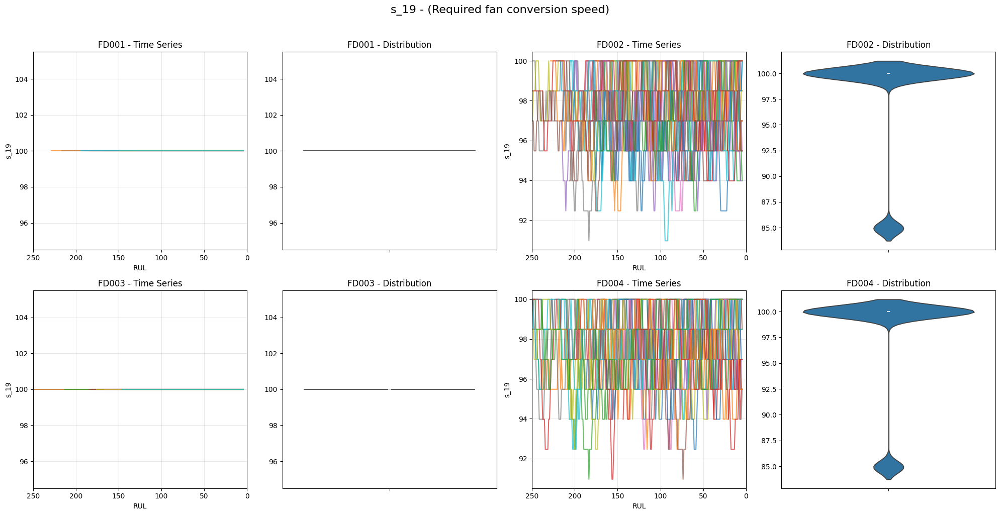

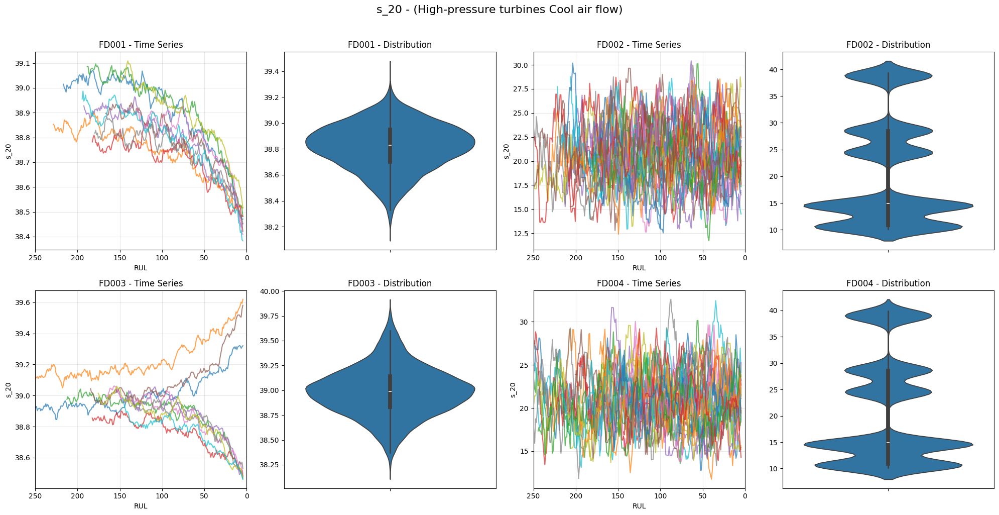

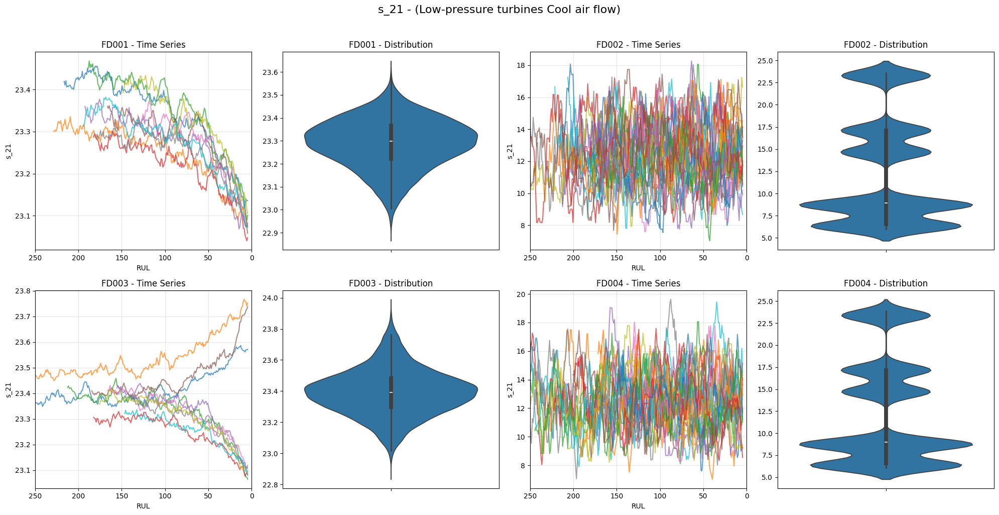

In [113]:
def plot_signal(df, Sensor_dic, signal_name):
    plt.figure(figsize=(13,5))
    for i in df['unit_number'].unique():
        if (i % 10 == 0):   #For a better visualization, we plot only 1 unit on 10
            plt.plot('RUL', signal_name, data=df[df['unit_number']==i].rolling(10).mean())

    plt.xlim(250, 0)  # reverse the x-axis so RUL counts down to zero
    plt.xticks(np.arange(0, 300, 25))
    plt.ylabel(f"{signal_name} - {Sensor_dic[signal_name]}")
    plt.xlabel('Remaining Useful Life')
    plt.show()

# Create plots with time series and violin side by side for each dataset
for i in range(1, 22):
    try:
        signal_name = f's_{i}'

        # Set consistent style for all plots
        plt.style.use('default')

        fig, axes = plt.subplots(2, 4, figsize=(20, 10))
        fig.suptitle(f"{signal_name} - {Sensor_dictionary[signal_name]}", fontsize=16, y=1.02)

        for j, fd_num in enumerate(['001', '002', '003', '004']):
            train = datasets[fd_num]['train']

            # Calculate row and column positions
            row = j // 2
            time_col = (j % 2) * 2      # 0, 2 for time series
            violin_col = (j % 2) * 2 + 1  # 1, 3 for violin plots

            # Time series plot
            axes[row, time_col].set_facecolor('white')
            axes[row, time_col].grid(True, alpha=0.3)
            axes[row, time_col].set_xlim(250, 0)
            axes[row, time_col].set_xticks(np.arange(0, 300, 50))
            axes[row, time_col].set_ylabel(f"{signal_name}")
            axes[row, time_col].set_xlabel('RUL')
            axes[row, time_col].set_title(f'FD{fd_num} - Time Series')

            for unit in train['unit_number'].unique():
                if (unit % 10 == 0):
                    unit_data = train[train['unit_number']==unit].rolling(10).mean()
                    axes[row, time_col].plot(unit_data['RUL'], unit_data[signal_name], alpha=0.7)

            # Violin plot
            sns.violinplot(data=train, y=signal_name, ax=axes[row, violin_col])
            axes[row, violin_col].set_title(f'FD{fd_num} - Distribution')
            axes[row, violin_col].set_ylabel('')

        plt.tight_layout()
        plt.show()

    except:
        pass

- There are a lot of assymetry among the 4 dataset
- similar pattern within (001, 003) and (002, 004) - engine fleet must share something - different categories?
- a lot of noise in sensors


From Kaggle competition page I can see that:
- 001   |   Condition: `ONE` (sea level)  |   Fault Modes: `ONE`
- 002   |   Condition: `SIX`              |   Fault Modes: `ONE`
- 003   |   Condition: `ONE`              |   Fault Modes: `TWO`
- 004   |   Condition: `SIX`              |   Fault Modes: `TWO`

So basically it's 4 different engine categories.

Let's use those 4 subsets for drifting strategy, using `test` data as 'production' data, and train to retrain. Will see later the batching strategy evolution in the time.

Could be 1 model per category, but let's try to find one that can handle all.